# BUSINESS CASE

No-Churn Telecom is an established Telecom operator in Europe 
with more than a decade in Business. Due to new players in the 
market, telecom industry has become very competitive and 
retaining customers becoming a challenge. \
In spite of No-Churn initiatives of reducing tariffs and promoting 
more offers, the churn rate ( percentage of customers migrating to 
competitors) is well above 10%.\
No-Churn wants to explore possibility of Machine Learning to help 
with following use cases to retain competitive edge in the industry.

#### **Attribute Information**

**State** : The state or region where the customer is located.\
**Account_length** : The duration (usually in days or months) that the customer has had an account with the telecom provider. Longer account lengths might indicate customer loyalty or stability.\
**AreaCode** : The area code of the customer’s phone number, often indicating their location or region.\
**Phone** : The phone number assigned to the customer. Usually, this is a unique identifier.\
**International_plan** : A binary feature (Yes/No) indicating whether the customer is subscribed to an international calling plan.\
**Vmail_plan** : A binary feature (Yes/No) indicating whether the customer has a voicemail plan.\
**Vmail_msg** : The number of voicemail messages received by the customer.\
**Day_mins** : The total number of minutes spent on daytime calls.\
**Day_calls** : The total number of daytime calls made by the customer.\
**Day_charge**: The total charges incurred for daytime calls. Higher charges could impact churn if customers find the costs high.\
**Eve_mines** : The total minutes spent on evening calls, reflecting call activity outside peak hours.\
**Eve_calls** : The total number of evening calls made by the customer.\
**Eve_charge** : The charges for evening calls, indicating possible impact on customers who make frequent off-peak calls.\
**Night_mines** : The total minutes spent on night calls, similar to evening minutes but for later times.\
**Night_calls** : The total number of night calls.\
**Night_charge** : The charges incurred for night calls.\
**International_mines** : The total minutes spent on international calls, potentially indicating international engagement.\
**International_calls** : The number of international calls made by the customer.\
**International_charge** : The charges incurred for international calls, which could influence churn for customers with high international activity.\
**CustServ_calls** : The number of calls the customer made to customer service. High numbers may indicate dissatisfaction or frequent issues, which can correlate with a higher churn likelihood.\
**Churn** : The target variable, indicating whether the customer has churned (Yes/No). This is the outcome we want to predict using the other features.





In [1]:
# import required library
import os                          # import os
import mysql.connector             # Used for connect the sql database
import pandas as pd                # used for data implementation, manipulation
import numpy as np                 # used for statitstical calculation
import seaborn as sns              # used for data visulaization
import matplotlib.pyplot as plt    # used for data visulaization
import warnings                    # used for ignore the warnings
warnings.filterwarnings('ignore')

In [2]:
# making connection to database server
connection = mysql.connector.connect(host = '18.136.157.135',
                                    user = 'dm_team3',
                                    password = 'DM!$!Team!27@9!20&')

In [3]:
## Check the number of databases available on the server
cursor = connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_telecom',)


In [4]:
## connecting database
connection = mysql.connector.connect(host= '18.136.157.135',
                                    user = 'dm_team3',
                                    password = 'DM!$!Team!27@9!20&',
                                    database = 'project_telecom')


In [5]:
# show tables from dataset
df_tables = pd.read_sql_query('show tables',connection)  
df_tables

,Tables_in_project_telecom
0,telecom_churn_data


In [6]:
# load the data
data = pd.read_sql_query('select * from telecom_churn_data',connection)
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [7]:
pd.set_option('display.max_columns',None)   # Temporarily display all columns

In [8]:
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,columns11,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [9]:
# creating a list of data columns
data_column = list(data.columns)

In [10]:
# changing the columns name
columns=['State','Account_length','AreaCode','Phone','International_plan','Vmail_plan','Vmail_msg',
                                'Day_mins','Day_calls','Day_charge','Eve_mines','Eve_calls','Eve_charge','Night_mines',
                                'Night_calls','Night_charge','International_mines','International_calls',
                                 'International_charge','CustServ_calls','Churn']
index=0
for i in columns:
        data.rename({data_column[index]:i},axis=1,inplace=True)
        index+=1

In [11]:
data

,State,Account_length,AreaCode,Phone,International_plan,Vmail_plan,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


## Basic Checks 

In [12]:
data.head()  # getting first 5 rows

,State,Account_length,AreaCode,Phone,International_plan,Vmail_plan,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [13]:
data.tail()  # getting last 5 rows

,State,Account_length,AreaCode,Phone,International_plan,Vmail_plan,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.8,126.8,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [14]:
data.info()  # gives the information about the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account_length        4617 non-null   object
 2   AreaCode              4617 non-null   object
 3   Phone                 4617 non-null   object
 4   International_plan    4617 non-null   object
 5   Vmail_plan            4617 non-null   object
 6   Vmail_msg             4617 non-null   object
 7   Day_mins              4617 non-null   object
 8   Day_calls             4617 non-null   object
 9   Day_charge            4617 non-null   object
 10  Eve_mines             4617 non-null   object
 11  Eve_calls             4617 non-null   object
 12  Eve_charge            4617 non-null   object
 13  Night_mines           4617 non-null   object
 14  Night_calls           4617 non-null   object
 15  Night_charge          4617 non-null   

**Insights**
* Here we can not see the null values in any columns.
* Here we can see that the total 4617 rows and 21 columns in the dataset.
* Here we can see that the storage of data is 757.6 kb.
* Here we can see that all columns are in object datatype.
    * so we change the numerical column in float or int datatype.

In [15]:
# Changing the datatype
int_dtype_column = ['Account_length','AreaCode','Vmail_msg','Day_calls','Eve_calls','Night_calls',
      'International_calls','CustServ_calls']
float_dtype_column = ['Day_mins','Day_charge','Eve_mines','Eve_charge','Night_mines','Night_charge',
                     'International_mines','International_charge']

data[int_dtype_column] = data[int_dtype_column].astype(int)
data[float_dtype_column] = data[float_dtype_column].astype(float)

In [16]:
data.info()   # check the datatypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account_length        4617 non-null   int32  
 2   AreaCode              4617 non-null   int32  
 3   Phone                 4617 non-null   object 
 4   International_plan    4617 non-null   object 
 5   Vmail_plan            4617 non-null   object 
 6   Vmail_msg             4617 non-null   int32  
 7   Day_mins              4617 non-null   float64
 8   Day_calls             4617 non-null   int32  
 9   Day_charge            4617 non-null   float64
 10  Eve_mines             4617 non-null   float64
 11  Eve_calls             4617 non-null   int32  
 12  Eve_charge            4617 non-null   float64
 13  Night_mines           4617 non-null   float64
 14  Night_calls           4617 non-null   int32  
 15  Night_charge         

In [17]:
data.describe()  # getting the statistical indformation of the numerical data

,Account_length,AreaCode,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


**Insights**
* Here we can not see the null values in any columns.
* Here we can see the minimum Account_length is 1 and maximum Account_length is 243.
* Here we can see the minimum Voicemail_message is 0 and maximum Voicemail_message is 51 in per day.
* Here we can see the minimum Day_calls is 0 and maximum Day_calls is 165 in a day.
* Here we can see the minimum Eve_calls is 0 and maximum Eve_calls is 170 in a day.
* Here we can see the minimum Night_calls is 12 and maximum Night_calls is 175 in a day.
* Here we can see the minimum price of International_charge is 0 and maximum price International_charge is 5.4 in a day.

In [18]:
data.describe(include='O') # getting the statistical indformation of the categorical data

,State,Phone,International_plan,Vmail_plan,Churn
count,4617,4617,4617,4617,4617
unique,51,4617,2,2,2
top,WV,382-4657,no,no,False.
freq,149,1,4171,3381,3961


**Insights**
* Here we can see the State have 51 unique value and the most occurance value is WV.
* Here we can see the Phone  have all unique values. it is a unique identifier of the customers.
* Here we can see the International_plan have 2 unique value and the most occurance value is no.
* Here we can see the Vmail_plan have 2 unique value and the most occurance value is no.
* Here we can see the Churn have 2 unique value and the most occurance value is False.

## Feature Engineering

**Feature Engineering** :- It is the process of using domain knowledge to select, modify or create new features from raw data that can improve the performance of machine learning model. It involves transforming raw data into a format that is more suitable for modeling and can significantly impact model accuracyand effectiveness.

### Data Preprocessing :

**Data preprocessing** :- It is a crucial step in machine learning that involves transforming raw data into a clean and usable format. This process ensures that the data is suitable for analysis and modeling, ultimately improving the performance and accuracy of machine learning models

In [19]:
data.isnull().sum()  # check the null value

State                   0
Account_length          0
AreaCode                0
Phone                   0
International_plan      0
Vmail_plan              0
Vmail_msg               0
Day_mins                0
Day_calls               0
Day_charge              0
Eve_mines               0
Eve_calls               0
Eve_charge              0
Night_mines             0
Night_calls             0
Night_charge            0
International_mines     0
International_calls     0
International_charge    0
CustServ_calls          0
Churn                   0
dtype: int64

* Here we can not see null values in any columns.

#### Handling Outliers

Outliers are data points that differ significantly from the majority of the data, often due to variability, errors, or unusual conditions. They can distort statistical analyses and model predictions if not properly hnadled.

In [20]:
# assign the continuous values
con_col = ['Account_length','Vmail_msg','Day_mins','Day_calls','Day_charge','Eve_mines',
           'Eve_calls','Eve_charge','Night_mines','Night_calls','Night_charge','International_mines',
           'International_calls','International_charge','CustServ_calls']

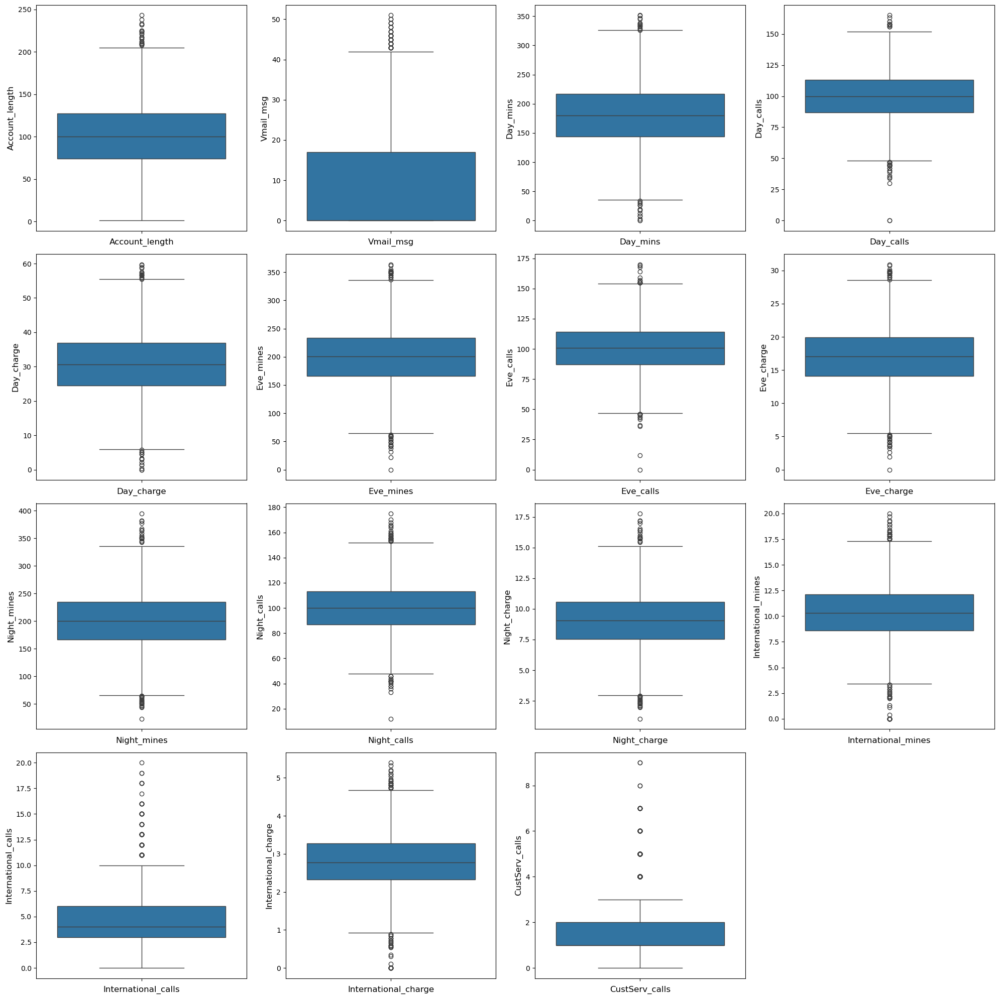

In [21]:
# check the outliers in the dataset
plt.figure(figsize=(20,20))  # canvas size
plt_num = 1

for i in data[con_col] :  # define for loop
    if plt_num<=15:   # apply if condition
        plt.subplot(4,4,plt_num)   # assign raw and column
        sns.boxplot(data[i])  # create boxplot
        plt.xlabel(i,fontsize=12)   # assign the xlabel value
        plt.ylabel(i,fontsize=12)   # assign the ylabel value
        plt_num+=1   # increment
plt.tight_layout()   # use for show data

In [22]:
# handle the outliers
data.loc[data.Account_length > 235, 'Account_length']  = data.Account_length.median()   
data.loc[data.Day_calls < 5, 'Day_calls']  = data.Day_calls.median()
data.loc[data.Eve_mines < 1, 'Eve_mines']  = data.Eve_mines.median()
data.loc[data.Eve_calls < 25, 'Eve_calls']  = data.Eve_calls.median()
data.loc[data.Eve_charge < 1, 'Eve_charge']  = data.Eve_charge.median()
data.loc[data.Night_calls < 20, 'Night_calls']  = data.Night_calls.median()

#### Encoding

Encoding is a technique which is used to convert the categorical data into a numerical data.

* There are three types of encoding :-
    1) Label Encoder
    2) Ordinal Encoder
    3) One Hot Encoder

In [23]:
data.columns   # shows all the columns of dataset

Index(['State', 'Account_length', 'AreaCode', 'Phone', 'International_plan',
       'Vmail_plan', 'Vmail_msg', 'Day_mins', 'Day_calls', 'Day_charge',
       'Eve_mines', 'Eve_calls', 'Eve_charge', 'Night_mines', 'Night_calls',
       'Night_charge', 'International_mines', 'International_calls',
       'International_charge', 'CustServ_calls', 'Churn'],
      dtype='object')

In [24]:
# assign the categorical variable
cat_col = ['State','International_plan','Vmail_plan','Churn']

In [25]:
# check the unique values in categorical column.
for i in cat_col :
    print(i,':',data[i].unique())
    print('________________________________________________________________________________________________')

State : ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']
________________________________________________________________________________________________
International_plan : [' no' ' yes']
________________________________________________________________________________________________
Vmail_plan : [' yes' ' no']
________________________________________________________________________________________________
Churn : [' False.' ' True.']
________________________________________________________________________________________________


* Here we can see that all categorical columns are nominal and not follow order. so we can use both LabelEncoder or OneHotEncoder. We apply LabelEncoder on this columns because it was appropriate choice.

In [26]:
# appling the LabelEncoder on categorical column
from sklearn.preprocessing import LabelEncoder  # import LabelEncoder
encoder = LabelEncoder()  # object creation
for i in cat_col :
    data[i] = encoder.fit_transform(data[i])  # ccovert the categorical data into numerical

In [27]:
data.head()  # getting first 5 rows

,State,Account_length,AreaCode,Phone,International_plan,Vmail_plan,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls,Churn
0,16,128,415,382-4657,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,371-7191,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,358-1921,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,408,375-9999,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,415,330-6626,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


* The Phone column have all unique values so we drop it.

In [28]:
# dropping the phone column
data.drop('Phone',axis=1,inplace=True)

In [29]:
data.AreaCode.unique()  # check unique value

array([415, 408, 510])

#### Scaling

Scaling is a technique which is used to transform the continuous value into a certain range.
Scaling is very important for continuous feature because some model give more priority to that features which has highest values.

* There are two types of scaling :-
    1) MinMaxScaler
    2) StandardScaler

In [30]:
# appling MinMaxScaler on continuous column
from sklearn.preprocessing import MinMaxScaler  # import MinMaxScaler
scaler = MinMaxScaler()  # create an instance object
data[con_col] = scaler.fit_transform(data[con_col])   # transform the data into 0 to 1 range

In [31]:
data

,State,Account_length,AreaCode,International_plan,Vmail_plan,Vmail_msg,Day_mins,Day_calls,Day_charge,Eve_mines,Eve_calls,Eve_charge,Night_mines,Night_calls,Night_charge,International_mines,International_calls,International_charge,CustServ_calls,Churn
0,16,0.547414,415,0,1,0.490196,0.754196,0.592593,0.754183,0.512888,0.470149,0.512927,0.595750,0.408451,0.595935,0.500,0.15,0.500000,0.111111,0
1,35,0.456897,415,0,1,0.509804,0.459744,0.688889,0.459672,0.507323,0.500000,0.507411,0.621840,0.492958,0.622236,0.685,0.15,0.685185,0.111111,0
2,31,0.586207,415,0,0,0.000000,0.692461,0.622222,0.692436,0.289690,0.552239,0.289555,0.374933,0.500000,0.375374,0.610,0.25,0.609259,0.000000,0
3,35,0.357759,408,1,0,0.000000,0.851778,0.303704,0.851740,0.115993,0.388060,0.115822,0.467187,0.394366,0.467424,0.330,0.35,0.329630,0.222222,0
4,36,0.318966,415,1,0,0.000000,0.474253,0.614815,0.474230,0.369069,0.641791,0.369183,0.440290,0.619718,0.440526,0.505,0.15,0.505556,0.333333,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,0.241379,510,0,1,0.490196,0.409673,0.377778,0.409639,0.483011,0.567164,0.482937,0.364174,0.626761,0.364614,0.425,0.30,0.425926,0.333333,0
4613,32,0.758621,408,0,1,0.568627,0.537696,0.451852,0.537651,0.822496,0.447761,0.822475,0.377622,0.584507,0.377764,0.785,0.05,0.785185,0.333333,0
4614,46,0.284483,408,0,1,0.647059,0.362731,0.711111,0.362784,0.801992,0.694030,0.802137,0.477945,0.408451,0.478183,0.650,0.15,0.650000,0.111111,0
4615,22,0.418103,415,0,1,0.450980,0.480512,0.503704,0.480422,0.597540,0.604478,0.597725,0.382733,0.443662,0.383144,0.715,0.15,0.714815,0.000000,0


## EDA : Exploratory Data Analysis

EDA is the process of analyzing and visualizing datasets.
* there are three type of EDA:
  1. Univariante Analysis
  2. Biavariante Analysis
  3. Multivariante Analysis

#### 1. Univariante Analysis

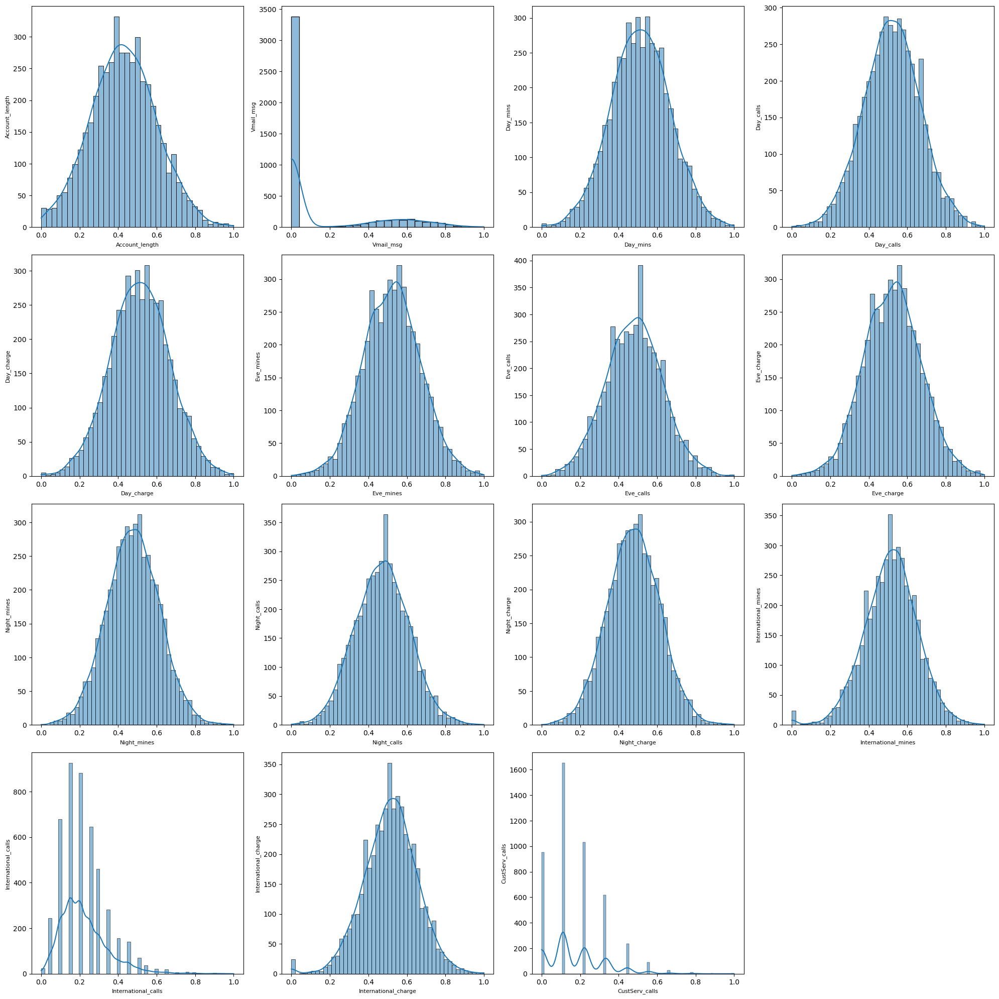

In [32]:
plt.figure(figsize=(20,20))  # canvas size
plt_num = 1

for i in data[con_col] :  # for loop
    if plt_num<=15:  # if condition
        plt.subplot(4,4,plt_num)  # assign raw and column
        sns.histplot(data[i],kde=True)  #create histplot
        plt.xlabel(i,fontsize=8)  # define size of xlabel
        plt.ylabel(i,fontsize=8)  # define size of ylabel
        plt_num+=1
plt.tight_layout()

**Insights**
* Here we use histplot for univariante analysis in continuous values
* Here we can see the normal dustribution in many columns like Account_length, Day_mins, Day_calls, Day_charge, Eve_mines, Eve_calls, Eve_charge, Night_mines, Night_calls, Night_charge, International_mines, International_charge.

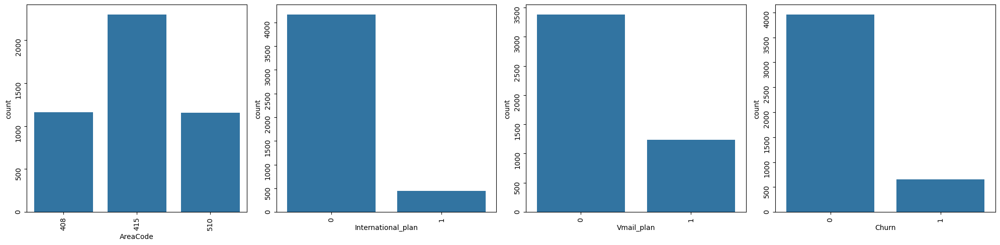

In [33]:
plt.figure(figsize=(20,5))  # canvas size
plt_num = 1

for i in data[['AreaCode','International_plan','Vmail_plan','Churn']] :  # for loop
    if plt_num<=4:  # if condition
        plt.subplot(1,4,plt_num)  # assign the raw andd column
        sns.countplot(x=data[i])  #create countplot
        plt.xticks(rotation=90)  # rotate the xticks
        plt.yticks(rotation=90)  # rotate the yticks
        plt_num+=1
plt.tight_layout()  # used for show plots

**Insights**
* Here we can see that most of the customers are from the 415 AreaCode.
* Here we can see that very less number of customers have international plan and Vmail plan.
* Here the Churn graph shows that the mejority of customers do not churn, as indicated by the significantly taller bar representing 'False' under the 'Churn' category. and the dataset in imbalanced.

#### 2. Biavariante Analysis

<Axes: xlabel='Day_mins', ylabel='Day_charge'>

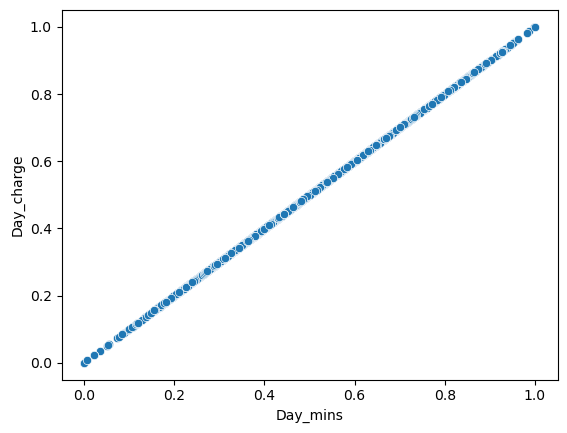

In [34]:
sns.scatterplot(x=data.Day_mins,y=data.Day_charge)  # create scatterplot

* Here we can see the positive relation between Day_mins and Day_charge.

<Axes: xlabel='Night_charge', ylabel='Night_calls'>

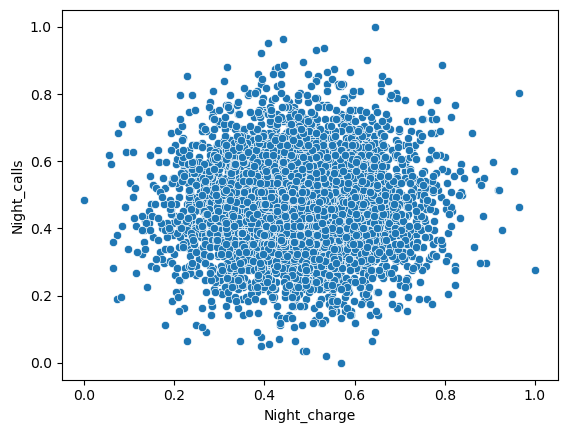

In [35]:
sns.scatterplot(x=data.Night_charge,y=data.Night_calls)  # create scatterplot

* Here we can see the zero relation between the Night_calls and Night_charge columns.

<Axes: xlabel='International_mines', ylabel='International_charge'>

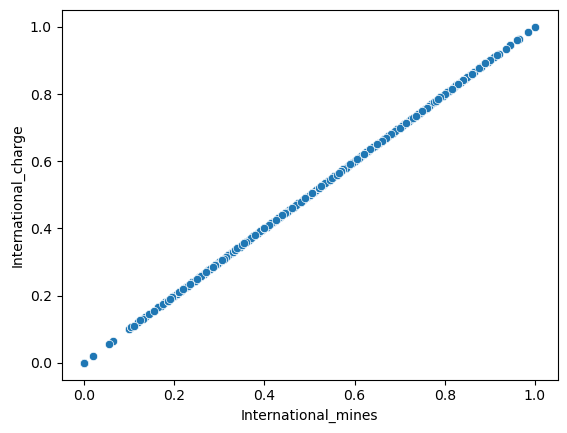

In [36]:
sns.scatterplot(x=data.International_mines,y=data.International_charge)  # create scatterplot

* Here we can see the positive correlation between International_mines and International_charge column.

#### 3. Multivariante Analysis

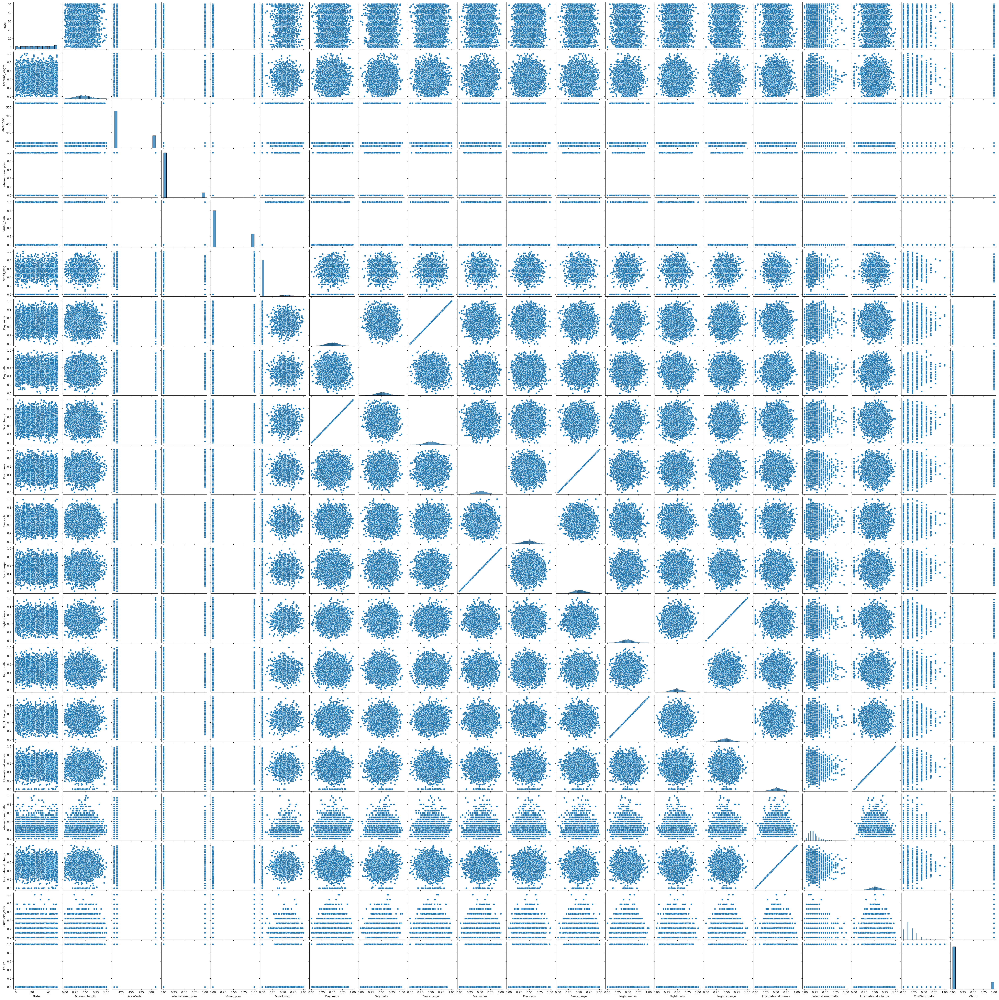

In [37]:
sns.pairplot(data)   # create a pairplot

**Insights**
* Here we can see the positive relation between Day_mins and Day_charge column, Eve_mines and Eve_charge column, Night_mines and Night_charge column, International_mines and International_charge columns.

## Feature Selection

**Feature Selection:-** It is the process of identifying and selecting a subset of relevant features (variables, predictors) from a larger set of available features in a dataset. The goal of feature selection is to improve the performance of machine learning models by retaining only the most important and informative features, while eliminating redundant or irrelevant ones.

<Axes: >

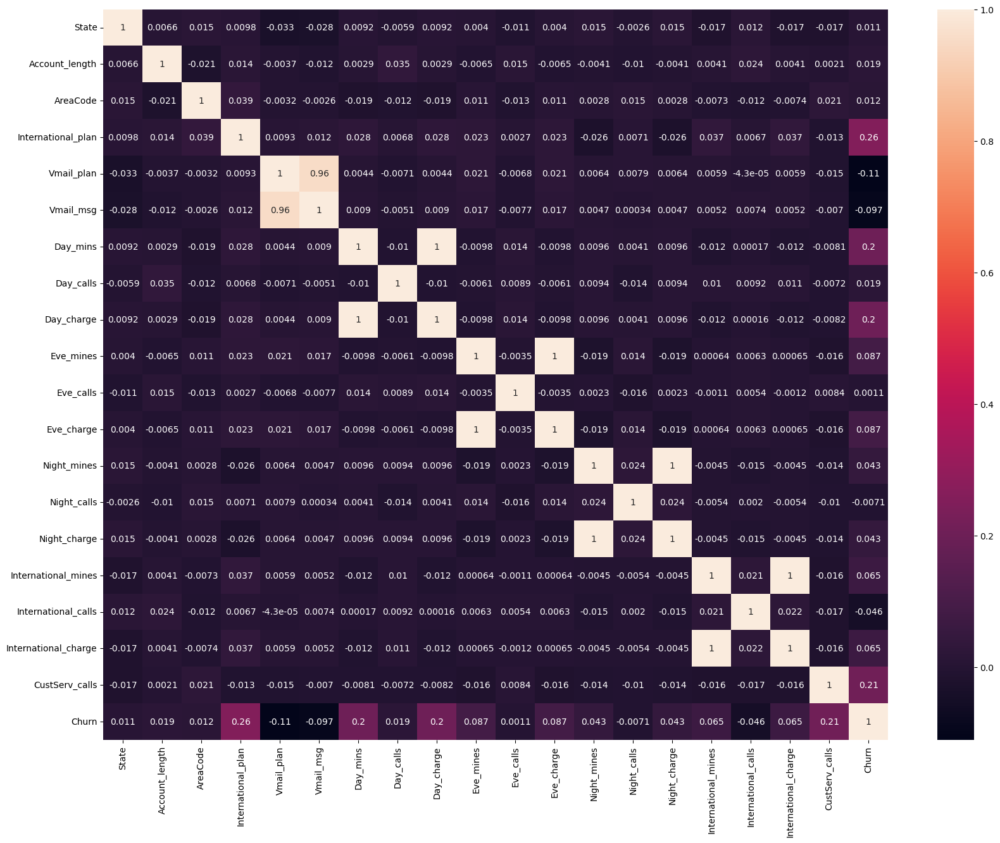

In [38]:
plt.figure(figsize=(20,15))  # define the plot size
sns.heatmap(data.corr(),annot=True)   # create heatmap for check the correlation

**Insights**
* Here we can see more than 90% correlation between Day_mins and Day_charge column, Night_mines and Night_charge column, Eve_mines and Eve_charge column, International_mines and International_charge column. So we can drop that some column.
* Here we can see less than 0.015% correlation between dependent variable and independent columns like State, AreaCode, Eve_calls and Night_calls. so we drop that columns.
* Here we can see that International_plan, Day_charge, CustServ_calls mostly influencing the Custome Churn. 

In [39]:
# drop the columns
data.drop(['International_mines','Night_mines','Eve_mines','Day_mins','Vmail_msg'],axis=1,inplace=True)
data.drop(['Eve_calls','Night_calls','State','AreaCode'],axis=1,inplace=True)

In [40]:
data   # check the data

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls,Churn
0,0.547414,0,1,0.592593,0.754183,0.512927,0.595935,0.15,0.500000,0.111111,0
1,0.456897,0,1,0.688889,0.459672,0.507411,0.622236,0.15,0.685185,0.111111,0
2,0.586207,0,0,0.622222,0.692436,0.289555,0.375374,0.25,0.609259,0.000000,0
3,0.357759,1,0,0.303704,0.851740,0.115822,0.467424,0.35,0.329630,0.222222,0
4,0.318966,1,0,0.614815,0.474230,0.369183,0.440526,0.15,0.505556,0.333333,0
...,...,...,...,...,...,...,...,...,...,...,...
4612,0.241379,0,1,0.377778,0.409639,0.482937,0.364614,0.30,0.425926,0.333333,0
4613,0.758621,0,1,0.451852,0.537651,0.822475,0.377764,0.05,0.785185,0.333333,0
4614,0.284483,0,1,0.711111,0.362784,0.802137,0.478183,0.15,0.650000,0.111111,0
4615,0.418103,0,1,0.503704,0.480422,0.597725,0.383144,0.15,0.714815,0.000000,0


## Model Creation

In [41]:
x = data.drop('Churn',axis=1)   # define independent variable
y = data['Churn']   # define dependent variable

In [42]:
x  # check the independent variable

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls
0,0.547414,0,1,0.592593,0.754183,0.512927,0.595935,0.15,0.500000,0.111111
1,0.456897,0,1,0.688889,0.459672,0.507411,0.622236,0.15,0.685185,0.111111
2,0.586207,0,0,0.622222,0.692436,0.289555,0.375374,0.25,0.609259,0.000000
3,0.357759,1,0,0.303704,0.851740,0.115822,0.467424,0.35,0.329630,0.222222
4,0.318966,1,0,0.614815,0.474230,0.369183,0.440526,0.15,0.505556,0.333333
...,...,...,...,...,...,...,...,...,...,...
4612,0.241379,0,1,0.377778,0.409639,0.482937,0.364614,0.30,0.425926,0.333333
4613,0.758621,0,1,0.451852,0.537651,0.822475,0.377764,0.05,0.785185,0.333333
4614,0.284483,0,1,0.711111,0.362784,0.802137,0.478183,0.15,0.650000,0.111111
4615,0.418103,0,1,0.503704,0.480422,0.597725,0.383144,0.15,0.714815,0.000000


In [43]:
y   # check the dependent variable

0       0
1       0
2       0
3       0
4       0
       ..
4612    0
4613    0
4614    0
4615    0
4616    0
Name: Churn, Length: 4617, dtype: int32

#### split the data into training and testing

In [44]:
from sklearn.model_selection import train_test_split  # import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=1)  # split the data

In [45]:
x_train   # check the training independent variable

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls
4340,0.568966,0,0,0.251852,0.488788,0.453292,0.537956,0.2,0.514815,0.111111
4224,0.129310,0,0,0.274074,0.406459,0.255774,0.727436,0.3,0.575926,0.000000
2933,0.418103,1,0,0.303704,0.450636,0.832816,0.325762,0.2,0.105556,0.111111
314,0.547414,0,0,0.511111,0.356091,0.536367,0.622236,0.1,0.944444,0.000000
4559,0.551724,0,0,0.333333,0.590863,0.495002,0.547519,0.3,0.579630,0.222222
...,...,...,...,...,...,...,...,...,...,...
2895,0.137931,1,0,0.511111,0.466533,0.382971,0.270771,0.2,0.320370,0.000000
2763,0.495690,0,1,0.548148,0.442938,0.477766,0.456067,0.1,0.409259,0.333333
905,0.689655,0,0,0.614815,0.545850,0.142365,0.488942,0.2,0.670370,0.444444
3980,0.232759,0,0,0.518519,0.515730,0.521889,0.548117,0.1,0.544444,0.111111


In [46]:
y_train  # check the training dependent variable

4340    0
4224    0
2933    0
314     0
4559    0
       ..
2895    0
2763    0
905     1
3980    0
235     1
Name: Churn, Length: 3693, dtype: int32

In [47]:
x_test   # check the testing independent variable

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls
3521,0.599138,0,1,0.822222,0.500669,0.524302,0.389719,0.25,0.355556,0.333333
190,0.456897,0,0,0.407407,0.380689,0.463289,0.239689,0.20,0.444444,0.000000
703,0.698276,0,1,0.548148,0.455154,0.489486,0.556485,0.35,0.520370,0.111111
4312,0.383621,0,0,0.333333,0.774264,0.294726,0.617454,0.10,0.459259,0.000000
2079,0.521552,0,0,0.525926,0.665997,0.521200,0.576210,0.45,0.655556,0.222222
...,...,...,...,...,...,...,...,...,...,...
2456,0.607759,0,0,0.325926,0.661479,0.467080,0.484160,0.30,0.520370,0.444444
1777,0.637931,0,0,0.392593,0.689926,0.653568,0.528392,0.15,0.500000,0.333333
2909,0.422414,0,0,0.533333,0.495315,0.224750,0.506874,0.10,0.385185,0.222222
1466,0.836207,0,0,0.577778,0.179719,0.579800,0.432756,0.15,0.255556,0.000000


In [48]:
y_test   # check the testing dependent variable

3521    0
190     0
703     0
4312    0
2079    0
       ..
2456    0
1777    1
2909    0
1466    0
1297    0
Name: Churn, Length: 924, dtype: int32

In [49]:
data.Churn.value_counts()  # check the values count

Churn
0    3961
1     656
Name: count, dtype: int64

#### Data Balancing

In [50]:
from imblearn.over_sampling import SMOTE   # import SMOTE
smote = SMOTE(random_state=42)   # create an instance object

In [51]:
# Apply SMOTE to balance the classes in the training data
sm_x_train,sm_y_train = smote.fit_resample(x_train,y_train)  

In [52]:
from collections import Counter  # import Counter

# print value counts before apply SMOTE and after apply SMOTE
print(Counter(y_train))   
print(Counter(sm_y_train))

Counter({0: 3150, 1: 543})
Counter({0: 3150, 1: 3150})


## Model SElection

### Logistic Regression

In [53]:
from sklearn.linear_model import LogisticRegression   # import LogisticRegression

In [54]:
lr = LogisticRegression()  # create an instance object
lr.fit(sm_x_train,sm_y_train)   # train the model

LogisticRegression()

In [55]:
lr_pred = lr.predict(x_test)   # predict the testing data

### Model Evaluation

In [56]:
# import classification metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,classification_report

In [57]:
accuracy_score(y_test,lr_pred)  # check the model performance

0.7911255411255411

In [58]:
f1_score(y_test,lr_pred)   # check the f1_score

0.46537396121883656

In [59]:
print(classification_report(y_test,lr_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.96      0.80      0.87       811
           1       0.34      0.74      0.47       113

    accuracy                           0.79       924
   macro avg       0.65      0.77      0.67       924
weighted avg       0.88      0.79      0.82       924



In [61]:
lr_tr_pred = lr.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train,lr_tr_pred)  # check the model performance

0.782063492063492

<Axes: xlabel='Churn', ylabel='Density'>

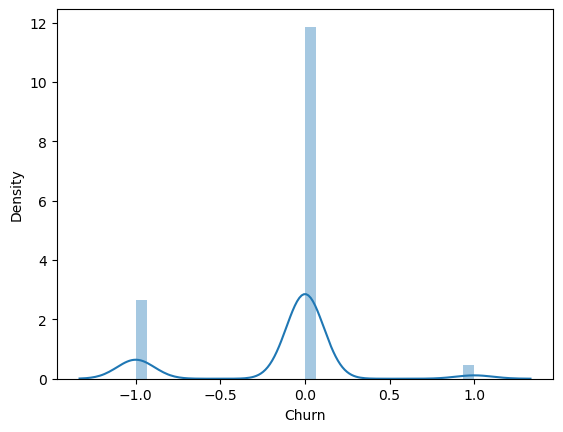

In [62]:
error = y_test - lr_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* Linear Regression model gives the generalize model. It's testing accuracy is 0.79 and training accuracy is 0.77.
* Linear Regression model not required the hyperparameter tuning but we apply it for increase the model performance.

In [63]:
from sklearn.model_selection import GridSearchCV  # import GridSearchCV

In [64]:
# set up the parameter grid for hyperparameter tuning
param_grid = {
    'C' : [0.1,0.01,1,10],             # Regularization strength
    'penalty' : ['l1','l2'],           # Regularization penalty type
    'solver' : ['liblinear','saga'],   # Solvers
    'max_iter' : [100,200,300]         # maximim numbrr of iteration
}

lr1 = LogisticRegression()  # create an instance object
# initialize the GrisSearchCV
grid_lr = GridSearchCV(estimator=lr1, param_grid=param_grid, cv=5, verbose=2, scoring='accuracy', refit=True)
grid_lr.fit(sm_x_train, sm_y_train)  # fit the GridSearchCV

grid_lr.best_params_  # shows the best params

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ..C=0.1, max_iter=100, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END .......C=0.1, max_iter=100, penalty=l1, solver=saga; total time=   0.0s
[CV] END .......C=0.1, max_iter=100, penalty=l1, solver=saga; total time=   0.0s
[CV] END .......C=0.1, max_iter=100, penalty=l1, solver=saga; total time=   0.0s
[CV] END .......C=0.1, max_iter=100, penalty=l1, solver=saga; total time=   0.0s
[CV] END .......C=0.1, max_iter=100, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=100, penalty=l2, sol

{'C': 0.1, 'max_iter': 200, 'penalty': 'l1', 'solver': 'saga'}

In [65]:
lr_pred1 = grid_lr.predict(x_test)  # predict the testing data
a1 = accuracy_score(y_test,lr_pred1)   # check the model performance
a1

0.7954545454545454

In [66]:
f1_1 = f1_score(y_test,lr_pred1)   # check the f1_score
f1_1

0.46760563380281694

In [67]:
lr_tr_pred1 = grid_lr.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train,lr_tr_pred1)   # check the model performance

0.7847619047619048

* After hyperparameter tuning, the model was not increased accuracy.

**Conclusion**
* Logistic regression model gives the generalize model.
* It's testing accuracy is 0.79 and training accuracy is 0.78. It's f1 score is 0.46.

### SVM Algorithm

In [68]:
from sklearn.svm import SVC   # import SVC

In [69]:
svc = SVC()  # create an instance object
svc.fit(sm_x_train,sm_y_train)  # train the model

SVC()

In [70]:
svc_pred = svc.predict(x_test)  # predict the testing data

In [71]:
accuracy_score(y_test,svc_pred)  # check the model performance

0.8896103896103896

In [72]:
f1_score(y_test,svc_pred)  # check the f1_score

0.6408450704225352

In [73]:
print(classification_report(y_test,svc_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.90      0.93       811
           1       0.53      0.81      0.64       113

    accuracy                           0.89       924
   macro avg       0.75      0.85      0.79       924
weighted avg       0.92      0.89      0.90       924



In [74]:
svc_tr_pred = svc.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train,svc_tr_pred)   # check the model performance

0.8868253968253968

<Axes: xlabel='Churn', ylabel='Density'>

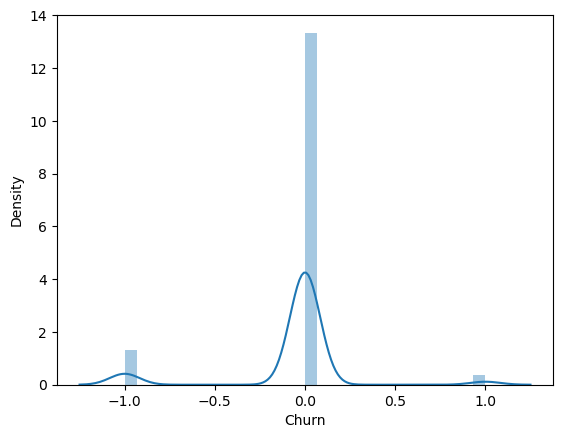

In [75]:
error = y_test - svc_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* SVM model gives the generalize model. It's testing accuracy is 0.88 and training accuracy is 0.88.
* SVM model not required the hyperparameter tuning but we apply it for increase the model performance.

In [76]:
from sklearn.model_selection import RandomizedSearchCV  # import RandomizedSearchCV

In [98]:
# set up the parameter grid for hyperparameter tuning
param_grid = {
    'C' : [0.1,0.01,1,10],  
    'gamma' : ['auto','scale'],
    'kernel' : ['rbf','poly','sigmoid','linear']
}

svc1 = SVC()  # create an instance object
# initialize the GrisSearchCV
random_svc = RandomizedSearchCV(estimator=svc1, param_distributions=param_grid, n_iter=100, verbose=2, scoring='accuracy', refit=True, random_state=42)
random_svc.fit(sm_x_train, sm_y_train)  # fit the GridSearchCV

random_svc.best_params_  # shows the best params

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   3.9s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   4.0s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   4.0s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   3.8s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   3.8s
[CV] END .....................C=0.1, gamma=auto, kernel=poly; total time=   2.7s
[CV] END .....................C=0.1, gamma=auto, kernel=poly; total time=   3.3s
[CV] END .....................C=0.1, gamma=auto, kernel=poly; total time=   3.8s
[CV] END .....................C=0.1, gamma=auto, kernel=poly; total time=   3.1s
[CV] END .....................C=0.1, gamma=auto, kernel=poly; total time=   2.8s
[CV] END ..................C=0.1, gamma=auto, kernel=sigmoid; total time=   3.1s
[CV] END ..................C=0.1, gamma=auto, k

{'kernel': 'rbf', 'gamma': 'scale', 'C': 10}

In [77]:
svc1 = SVC(kernel='rbf',gamma='scale',C=10)  # initialize SVC
svc1.fit(sm_x_train, sm_y_train)  # train the model

SVC(C=10)

In [78]:
svc_pred1 = svc1.predict(x_test)   # predict the testing data
a2 = accuracy_score(y_test, svc_pred1)  # check the model performance
a2

0.9318181818181818

In [79]:
f1_2 = f1_score(y_test, svc_pred1)  # check the f1 score
f1_2

0.7407407407407407

In [80]:
svc_tr_pred1 = svc1.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train, svc_tr_pred1)  # check the model performance

0.9188888888888889

**Conclusion**
* SVM model gives the generalize model.
* After appling the hyperparameter tuning, It's testing accuracy is 0.93 and training accuracy is 0.91. It's f1 score is 0.74.

### Decision Tree Algorithm

In [81]:
from sklearn.tree import DecisionTreeClassifier  # import DecisionTreeClassifier

In [82]:
dt = DecisionTreeClassifier(random_state=0)   # create an instance object
dt.fit(sm_x_train,sm_y_train)   # train the model

DecisionTreeClassifier(random_state=0)

In [83]:
dt_pred = dt.predict(x_test)   # predict the testing data

In [84]:
accuracy_score(y_test,dt_pred)   # check the model performance

0.9188311688311688

In [85]:
f1_score(y_test,dt_pred)    # check the f1_score

0.6913580246913581

In [86]:
print(classification_report(y_test,dt_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.96      0.94      0.95       811
           1       0.65      0.74      0.69       113

    accuracy                           0.92       924
   macro avg       0.80      0.84      0.82       924
weighted avg       0.92      0.92      0.92       924



In [88]:
dt_tr_pred = dt.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train,dt_tr_pred)   # check the model performance

1.0

<Axes: xlabel='Churn', ylabel='Density'>

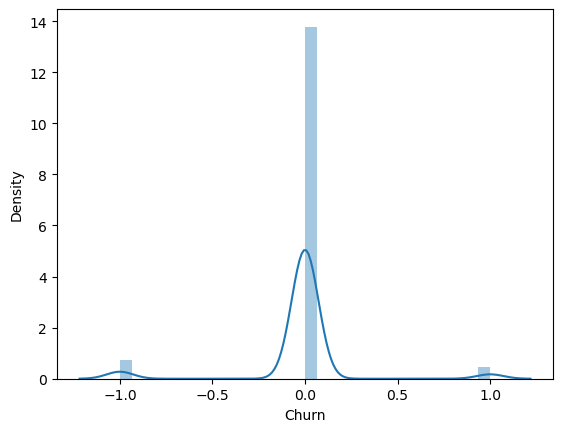

In [89]:
error = y_test - dt_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* Decision Tree model is not give the generalize model. It occurs Overfitting. 
* It's testing accuracy is 0.9188 and training accuracy is 1.0.
* Decision Tree model required the hyperparameter tuning.

In [111]:
# set up the params for hyperparameter tuning
param_grid = {
    'criterion' : ['gini','entropy'],
    'splitter' : ['best','random'],
    'max_depth' : [4,6,7,3,9,10,11],
    'min_samples_split' : [2,3,5,7,10],
    'min_samples_leaf' : [4,5,8,9,12,11,14]
}

dt1 = DecisionTreeClassifier(random_state=0)  # create an insatnce object
# initialize GridSearchCV
grid_dt = GridSearchCV(estimator=dt1, param_grid=param_grid, refit=True, scoring='accuracy', verbose=2, cv=2)
grid_dt.fit(sm_x_train,sm_y_train)  # fit GridSearchCV

grid_dt.best_params_  # shows the best params

Fitting 2 folds for each of 980 candidates, totalling 1960 fits
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=2, splitter=random; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=2, splitter=random; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=3, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=3, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=3, splitter=random; total time=   0.0s
[CV] END criterion=gini, max_depth=4, min_samples_leaf=4, min_samples_split=3, splitter=random; total time=   0.0s
[CV] END criterion=gini,

{'criterion': 'entropy',
 'max_depth': 11,
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'splitter': 'best'}

In [90]:
dt1 = DecisionTreeClassifier(criterion='entropy',max_depth=11,min_samples_leaf=4,min_samples_split=2,
                             splitter='best', random_state=0)
dt1.fit(sm_x_train, sm_y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=11, min_samples_leaf=4,
                       random_state=0)

In [91]:
dt_pred1 = dt1.predict(x_test)  # predict the testing data
a3 = accuracy_score(y_test, dt_pred1)  # check the model performance
a3

0.935064935064935

In [92]:
f1_3 = f1_score(y_test, dt_pred1)  # check the f1_score
f1_3

0.736842105263158

In [93]:
dt_tr_pred1 = dt1.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train, dt_tr_pred1)  # check the model performance

0.9533333333333334

**Conclusion**
* Decision Tree model gives the generalize model after appling the hyperparameter tuning.
* It's testing accuracy is 0.9350 and training accuracy is 0.9533. It's f1 score is 0.73.

### Bagging Algorithm

In [94]:
from sklearn.ensemble import BaggingClassifier   # import BaggingClassifier

In [95]:
bg = BaggingClassifier(random_state=10)   # create an instance object
bg.fit(sm_x_train,sm_y_train)   # train the model

BaggingClassifier(random_state=10)

In [96]:
bg_pred = bg.predict(x_test)    # predict the testing data

In [97]:
accuracy_score(y_test, bg_pred)   # check the model performance

0.9588744588744589

In [98]:
f1_score(y_test,bg_pred)   # check the f1_score

0.822429906542056

In [99]:
print(classification_report(y_test,bg_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       811
           1       0.87      0.78      0.82       113

    accuracy                           0.96       924
   macro avg       0.92      0.88      0.90       924
weighted avg       0.96      0.96      0.96       924



In [100]:
bg_tr_pred = bg.predict(sm_x_train)    # predict the training data
accuracy_score(sm_y_train,bg_tr_pred)   # check the model performance

0.9971428571428571

<Axes: xlabel='Churn', ylabel='Density'>

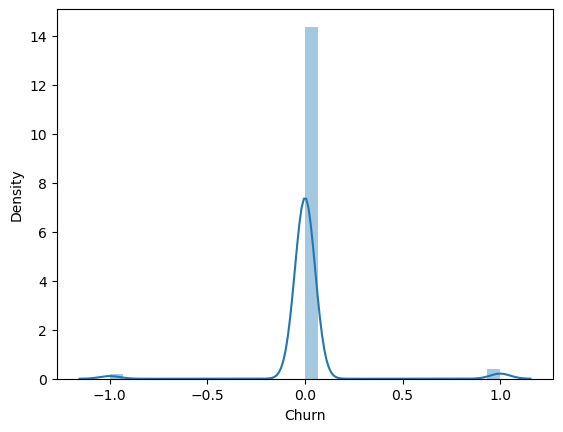

In [101]:
error = y_test - bg_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* Bagging Model is generalized with a minor tendency toward overfitting. 
* It's testing accuracy is 0.9588 and training accuracy is 0.9971.
* Bagging model required the hyperparameter tuning.

In [103]:
# Set up the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators' : [50,80,100,200],
    'max_features' : [0.9,0.5,0.7],
    'max_samples' : [0.8,0.6],
}

bg1 = BaggingClassifier()  # craete an instance object
# initialize GridSearchCV
grid_bg = GridSearchCV(estimator=bg1,param_grid=param_grid,verbose=2,refit=True,scoring='accuracy',cv=5)
grid_bg.fit(sm_x_train,sm_y_train)  # fit GridSearchCV

grid_bg.best_params_  # shows the best params

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=50; total time=   2.1s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=50; total time=   1.8s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=50; total time=   1.7s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=50; total time=   1.8s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=50; total time=   2.0s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=80; total time=   3.3s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=80; total time=   2.9s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=80; total time=   2.9s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=80; total time=   2.8s
[CV] END .max_features=0.9, max_samples=0.8, n_estimators=80; total time=   2.9s
[CV] END max_features=0.9, max_samples=0.8, n_estimators=100; total time=   3.6s
[CV] END max_features=0.9, max_samples=0.8, n_e

{'max_features': 0.7, 'max_samples': 0.8, 'n_estimators': 200}

In [104]:
bg_pred1 = grid_bg.predict(x_test)  # predict the testing data
accuracy_score(y_test, bg_pred1)   # check the model performance

0.9502164502164502

In [105]:
bg_tr_pred1 =grid_bg.predict(sm_x_train)  # predict the testing data
accuracy_score(sm_y_train, bg_tr_pred1)   # check the model performance

1.0

* After the hyperparameter tuning, Bagging Model is generalized but occurs little overfitting. 

In [106]:
bg2 = BaggingClassifier(max_features=0.7, max_samples=0.2, n_estimators=200,random_state=1)
bg2.fit(sm_x_train, sm_y_train)

BaggingClassifier(max_features=0.7, max_samples=0.2, n_estimators=200,
                  random_state=1)

In [107]:
bg_pred2 = bg2.predict(x_test)  # predict the testing data
a4 = accuracy_score(y_test, bg_pred2)   # check the model performance
a4

0.9502164502164502

In [108]:
f1_4 = f1_score(y_test, bg_pred2)   # check the f1_score
f1_4

0.7964601769911505

In [109]:
bg_tr_pred2 = bg2.predict(sm_x_train)  # predict the testing data
accuracy_score(sm_y_train, bg_tr_pred2)   # check the model performance

0.9785714285714285

**Conclusion**
* Bagging model gives the generalize model.
* It's testing accuracy is 0.95 and training accuracy is 0.97. It's f1 score is 0.79.

### Random Forest Algorithm

In [110]:
from sklearn.ensemble import RandomForestClassifier   # import RandomForestClassifier

In [111]:
rf = RandomForestClassifier(random_state=1)   # create an instance object
rf.fit(sm_x_train,sm_y_train)   # train the model

RandomForestClassifier(random_state=1)

In [112]:
rf_pred = rf.predict(x_test)   # predict the testing data

In [113]:
accuracy_score(y_test, rf_pred)   # check the model performance

0.9567099567099567

In [114]:
f1_score(y_test,rf_pred)    # check the f1_score

0.81651376146789

In [115]:
print(classification_report(y_test,rf_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       811
           1       0.85      0.79      0.82       113

    accuracy                           0.96       924
   macro avg       0.91      0.88      0.90       924
weighted avg       0.96      0.96      0.96       924



In [116]:
rf_tr_pred = rf.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train, rf_tr_pred)   # check the model performance

1.0

<Axes: xlabel='Churn', ylabel='Density'>

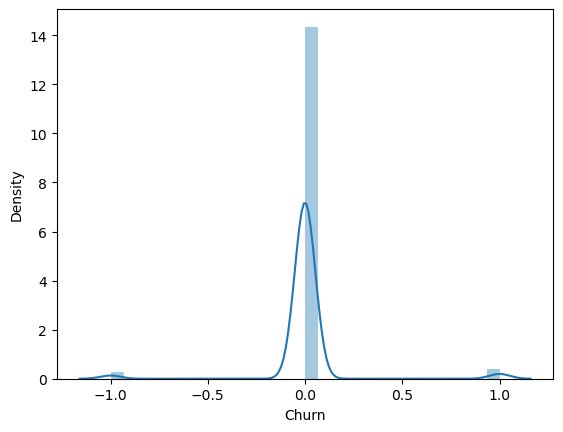

In [117]:
error = y_test - rf_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* Random Forest Model is generalized with a minor tendency toward overfitting. 
* It's testing accuracy is 0.9567 and training accuracy is 1.0.
* Random Forest model required the hyperparameter tuning.

In [112]:
# set up the params for hyperparameter tuning
param_grid = {
    'n_estimators' : [int(x) for x in np.linspace(start=200, stop=2000, num=5)],
    'max_depth' : [4,6,8,10],
    'max_features' : ['auto','sqrt','log2'],
    'min_samples_split' : [5,10],
    'min_samples_leaf' : [2,4]
}

rf1 = RandomForestClassifier(random_state=1)  # create an instance object
# initialize the GRidSearchCV
random_rf = RandomizedSearchCV(estimator=rf1, param_distributions=param_grid, refit=True, scoring='accuracy', 
                               verbose=2, n_iter=20, random_state=0)
random_rf.fit(sm_x_train, sm_y_train)  # fit GridSearchCV

random_rf.best_params_   # shows the best params

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  21.7s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  21.4s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  21.3s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  21.5s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  22.1s
[CV] END max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=650; total time=   7.2s
[CV] END max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=650; total time=   6.8s
[CV] END max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=

{'n_estimators': 2000,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 10}

In [118]:
rf1 = RandomForestClassifier(n_estimators=2000, min_samples_split=5, min_samples_leaf=2,
                            max_features='auto', max_depth=10, random_state=1)  # initialize RandomForestClassifier
rf1.fit(sm_x_train,sm_y_train)  # train the model

RandomForestClassifier(max_depth=10, max_features='auto', min_samples_leaf=2,
                       min_samples_split=5, n_estimators=2000, random_state=1)

In [119]:
rf_pred1 = rf1.predict(x_test)   # predict the testing data
a5 = accuracy_score(y_test, rf_pred1)  # check the model performance
a5

0.9502164502164502

In [120]:
f1_5 = f1_score(y_test, rf_pred1)  # check the f1_score
f1_5

0.7927927927927928

In [121]:
rf_tr_pred1 = rf1.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train, rf_tr_pred1)  # check the model performance

0.9528571428571428

**Conclusion**
* After appling the hyperparameter tuning, Random Forest model gives the generalize model.
* It's testing accuracy is 0.95 and training accuracy is 0.95. It's f1 score is 0.79.

### Gradient Boosting Algorithm

In [122]:
from sklearn.ensemble import GradientBoostingClassifier   # import GradientBoostingClassifier

In [123]:
gb = GradientBoostingClassifier(learning_rate=0.3,max_depth=7,n_estimators=80, random_state=4)    # create an instance object
gb.fit(sm_x_train,sm_y_train)   # train the model

GradientBoostingClassifier(learning_rate=0.3, max_depth=7, n_estimators=80,
                           random_state=4)

In [124]:
gb_pred = gb.predict(x_test)   # predict the testing data

In [125]:
a6 = accuracy_score(y_test,gb_pred)   # check the model performance
a6

0.9675324675324676

In [126]:
f1_6 = f1_score(y_test,gb_pred)   # check the f1_score
f1_6

0.8557692307692308

In [127]:
print(classification_report(y_test,gb_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       811
           1       0.94      0.79      0.86       113

    accuracy                           0.97       924
   macro avg       0.95      0.89      0.92       924
weighted avg       0.97      0.97      0.97       924



In [128]:
gb_tr_pred = gb.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train,gb_tr_pred)   # check the model performance

1.0

<Axes: xlabel='Churn', ylabel='Density'>

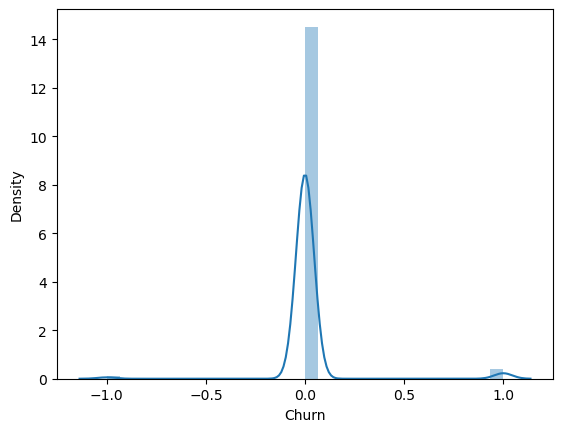

In [129]:
error = y_test - gb_pred   # assign the error value
sns.distplot(error, kde=True)   # plot the error value

**Conclusion**
* Gradient Boosting model gives the generalize model.
* It's testing accuracy is 0.9675 and training accuracy is 1.0. It's f1_score is 0.85.
* Gradient Boosting model not required the hyperparameter tuning.

## eXtreme Gradient Boosting

In [130]:
from xgboost import XGBClassifier   # import XGBClassifier

In [131]:
xgb = XGBClassifier(learning_rate_init=0.01,n_estimatoes=80)   # create an instance object
xgb.fit(sm_x_train,sm_y_train)  # train the model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None,
              learning_rate_init=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimatoes=80,
              n_estimators=None, n_jobs=None, ...)

In [132]:
xgb_pred = xgb.predict(x_test)  # predict the testing data

In [133]:
a7 = accuracy_score(y_test,xgb_pred)  # check the model performance
a7

0.9664502164502164

In [134]:
f1_7 = f1_score(y_test, xgb_pred)  # check the f1_score
f1_7

0.8544600938967136

In [135]:
print(classification_report(y_test,xgb_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       811
           1       0.91      0.81      0.85       113

    accuracy                           0.97       924
   macro avg       0.94      0.90      0.92       924
weighted avg       0.97      0.97      0.97       924



In [136]:
xgb_tr_pred = xgb.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train,xgb_tr_pred)   # check the model performance

0.9998412698412699

<Axes: xlabel='Churn', ylabel='Density'>

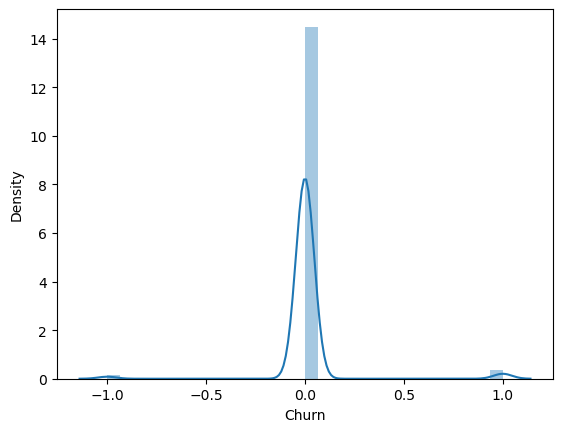

In [137]:
error = y_test - xgb_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

**Conclusion**
* eXtreme Gradient Boosting model gives the generalize model.
* It's testing accuracy is 0.9664 and training accuracy is 0.9998. It's f1_score is 0.85.
* XGB model not required the hyperparameter tuning.

### AdaBoost Algorithm

In [138]:
from sklearn.ensemble import AdaBoostClassifier  # import AdaBoostClassifier

In [139]:
ab = AdaBoostClassifier()  # create an insatnce object
ab.fit(sm_x_train, sm_y_train)  # train the model

AdaBoostClassifier()

In [140]:
ab_pred = ab.predict(x_test)   # predict the testing data

In [141]:
accuracy_score(y_test, ab_pred)   # check the model performance

0.8787878787878788

In [142]:
f1_score(y_test, ab_pred)  # check the f1_score

0.5725190839694657

In [143]:
print(classification_report(y_test,ab_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.95      0.91      0.93       811
           1       0.50      0.66      0.57       113

    accuracy                           0.88       924
   macro avg       0.73      0.79      0.75       924
weighted avg       0.90      0.88      0.89       924



In [144]:
ab_tr_pred = ab.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train, ab_tr_pred)   # check the model performance

0.8888888888888888

<Axes: xlabel='Churn', ylabel='Density'>

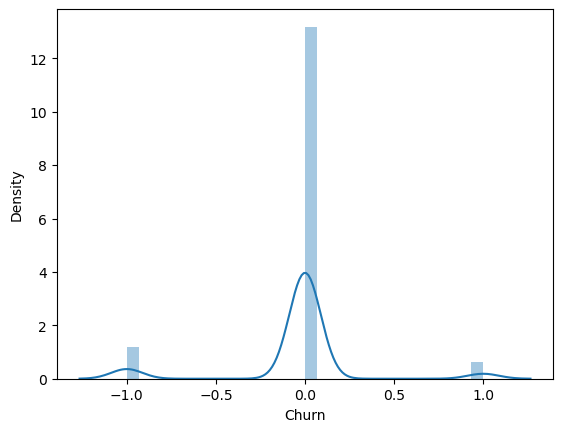

In [145]:
error = y_test - ab_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* AdaBoost model gives the generalize model. It's testing accuracy is 0.8787 and training accuracy is 0.8888.
* AdaBoost model not required the hyperparameter tuning but we apply it for increase the model performance.

In [283]:
# Set up the params for hyperparameter tuning
param_grid = {
    'base_estimator' : [DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=2)],
    'learning_rate' : [0.01,0.1,1],
    'n_estimators' : [50,100,200],
    'algorithm' : ['SAMME','SAMME.R']
}

ab1 = AdaBoostClassifier()  # create an instance object
# initialize the GridSearchCV
grid_ab = GridSearchCV(estimator=ab1, param_grid=param_grid, refit=True, scoring='accuracy', cv=5, verbose=2)
grid_ab.fit(sm_x_train, sm_y_train)   # fit the GridSearchCV

grid_ab.best_params_    # shows the best params

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=50; total time=   0.7s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=50; total time=   0.7s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=50; total time=   0.6s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=50; total time=   0.6s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=50; total time=   0.7s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=100; total time=   1.5s
[CV] END algorithm=SAMME, base_estimator=DecisionTreeClassifier(max_depth=1), learning_rate=0.01, n_estimators=100; total time=   1.4

{'algorithm': 'SAMME.R',
 'base_estimator': DecisionTreeClassifier(max_depth=2),
 'learning_rate': 0.1,
 'n_estimators': 200}

In [152]:
ab1 = AdaBoostClassifier(algorithm='SAMME.R', base_estimator=DecisionTreeClassifier(max_depth=2),
                        learning_rate=0.1, n_estimators=200, random_state=0)   # initialize AdaBoostClassifier
ab1.fit(sm_x_train, sm_y_train)  # train the model

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                   learning_rate=0.1, n_estimators=200, random_state=0)

In [153]:
ab_pred1 = ab1.predict(x_test)   # predict the testing data
a8 = accuracy_score(y_test, ab_pred1)   # check the model performance
a8

0.9437229437229437

In [154]:
f1_8 = f1_score(y_test,ab_pred1)  # check the f1_score
f1_8

0.7636363636363637

In [155]:
ab_tr_pred1 = ab1.predict(sm_x_train)   # predict the training data
accuracy_score(sm_y_train, ab_tr_pred1)   # check the model performance

0.9712698412698413

**Conclusion**
* After appling the hyperparameter tuning, Ada Boost model gives the generalize model.
* It's testing accuracy is 0.9437 and training accuracy is 0.9712. It's f1 score is 0.76.

### Aritificial Neural Networks

In [156]:
from sklearn.neural_network import MLPClassifier  # import MLPClassifier

In [157]:
ann = MLPClassifier(random_state=1)  # create an instance object
ann.fit(sm_x_train, sm_y_train)   # train the model

MLPClassifier(random_state=1)

In [158]:
ann_pred = ann.predict(x_test)  # predict the testing data

In [159]:
accuracy_score(y_test, ann_pred)   # check the model performance

0.9101731601731602

In [160]:
f1_score(y_test, ann_pred)   # check the f1-score

0.6795366795366794

In [161]:
print(classification_report(y_test,ann_pred))   # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.93      0.95       811
           1       0.60      0.78      0.68       113

    accuracy                           0.91       924
   macro avg       0.79      0.85      0.81       924
weighted avg       0.92      0.91      0.91       924



In [162]:
ann_tr_pred = ann.predict(sm_x_train)  # predict the training data
accuracy_score(sm_y_train, ann_tr_pred)   # check the model performance

0.8985714285714286

<Axes: xlabel='Churn', ylabel='Density'>

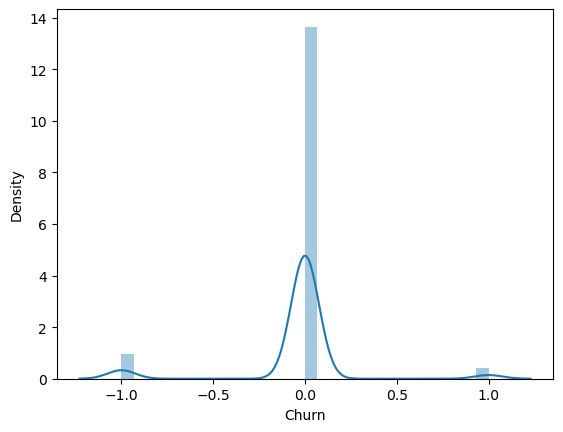

In [163]:
error = y_test - ann_pred  # assign the error value
sns.distplot(error, kde=True)  # plot the error value

* ANN model gives the generalize model. It's testing accuracy is 0.9101 and training accuracy is 0.8985.
* ANN model not required the hyperparameter tuning but we apply it for increase the model performance.

In [339]:
# set up the params for hyperparameter tuning
param_grid = {
    'hidden_layer_sizes' : [40,60,80],
    'activation' : ['relu','tanh'],
    'max_iter' : [100,150],
    'learning_rate_init' : [0.01,0.1,0.001],
    'batch_size' : [16,32,64]
}

ann1 = MLPClassifier(random_state=1)   # craete an instance object
# initialize the GridSearchCV
grid_ann = GridSearchCV(estimator=ann1, param_grid=param_grid, verbose=2, refit=True, cv=3, scoring='accuracy')
grid_ann.fit(sm_x_train, sm_y_train)  # fit the GridSearchCV

grid_ann.best_params_   # shows the best params

Fitting 3 folds for each of 108 candidates, totalling 324 fits
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=100; total time=  11.1s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=100; total time=  17.6s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=100; total time=  16.5s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=150; total time=  10.0s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=150; total time=  26.4s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.01, max_iter=150; total time=  24.6s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0.1, max_iter=100; total time=   7.5s
[CV] END activation=relu, batch_size=16, hidden_layer_sizes=40, learning_rate_init=0

{'activation': 'relu',
 'batch_size': 64,
 'hidden_layer_sizes': 80,
 'learning_rate_init': 0.01,
 'max_iter': 150}

In [164]:
ann1 = MLPClassifier(activation='relu',batch_size=64, hidden_layer_sizes=80, max_iter=150,
             learning_rate_init=0.01, random_state=2)   # create an instance object
ann1.fit(sm_x_train, sm_y_train)   # train the model

MLPClassifier(batch_size=64, hidden_layer_sizes=80, learning_rate_init=0.01,
              max_iter=150, random_state=2)

In [165]:
ann_pred1 = ann1.predict(x_test)   # predict the testing data
a9 = accuracy_score(y_test, ann_pred1)   # check the model performance
a9

0.946969696969697

In [166]:
f1_9 = f1_score(y_test, ann_pred1)   # check the f1_score
f1_9

0.7841409691629955

In [167]:
ann_tr_pred1 = ann1.predict(sm_x_train)   # predict the testing data
accuracy_score(sm_y_train, ann_tr_pred1)   # check the model performance

0.932063492063492

**Conclusion**
* After appling the hyperparameter tuning, ANN model gives the generalize model.
* It's testing accuracy is 0.9469 and training accuracy is 0.9320. It's f1 score is 0.78.

## Model Comparision Report

In [168]:
# make a table for all algorithm's performance and error
score = pd.DataFrame({"Model":['Logistic regression','SVM','Decision Tree ALgorithm','Bagging ALgorithm',
                    'Random Forest ALgorithm','Gradient Boosting','XGB Classifier','AdaBoost ALgorithm','ANN'],
                     "accuracy_score":[a1*100,a2*100,a3*100,a4*100,a5*100,a6*100,a7*100,a8*100,a9*100],
                     "f1_score":[f1_1,f1_2,f1_3,f1_4,f1_5,f1_6,f1_7,f1_8,f1_9]})

In [170]:
score

,Model,accuracy_score,f1_score
0,Logistic regression,79.545455,0.467606
1,SVM,93.181818,0.740741
2,Decision Tree ALgorithm,93.506494,0.736842
3,Bagging ALgorithm,95.021645,0.796460
4,Random Forest ALgorithm,95.021645,0.792793
5,Gradient Boosting,96.753247,0.855769
6,XGB Classifier,96.645022,0.854460
7,AdaBoost ALgorithm,94.372294,0.763636
8,ANN,94.696970,0.784141


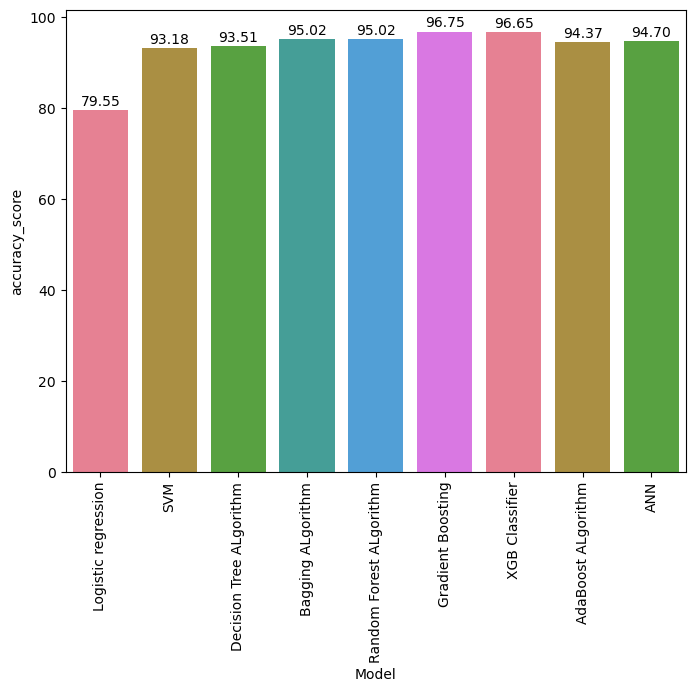

In [171]:
# use for All model performance show in barplot graph
palette = sns.color_palette("husl") # define the color for barplot 
plt.figure(figsize=(8, 6)) # define the plot size
plt.xticks(rotation = 90) # rotation x ticks
a = sns.barplot(x=score.Model, y=score.accuracy_score, data=score, palette=palette) # create the barplot

for index, value in enumerate(score['accuracy_score']): # show indivisual bar values show
    a.text(index, value + 1, f'{value:.2f}', ha='center')

#### **Final Conclusion**

* I have used 9 Algorithms like Logistic Regression, SVM, Decision Tree, Bagging Algorithm, Random Forest, Gradient Boosting, XGB Regressor, AdaBoost Regressor and ANN.
* There are all algorithms gives generalized model.
* Best Algorithm is Gradient Boosting, which is generalized model and gives highest accuracy 96.75 and highest f1_score 85.57.
* Most of algorithm provides the model performance greater than 0.90.

**We apply the Gradient Boosting Algorithm for create the Churn Risk Score because it gives the highest accuracy_score 96.75% and it also support the probability prediction.**

#### Understanding the Variables Influencing Customer Churn

In [172]:
model = GradientBoostingClassifier(learning_rate=0.3,max_depth=7,n_estimators=80, random_state=4)  # create an instance object
model.fit(sm_x_train,sm_y_train)   # train the model

GradientBoostingClassifier(learning_rate=0.3, max_depth=7, n_estimators=80,
                           random_state=4)

In [173]:
feature_imp = model.feature_importances_

In [174]:
Feature_importance = pd.Series(feature_imp,index=x.columns).sort_values()
Feature_importance

Account_length          0.014107
Day_calls               0.023454
Night_charge            0.040243
Vmail_plan              0.041931
International_calls     0.063011
International_charge    0.081495
Eve_charge              0.102825
International_plan      0.175994
CustServ_calls          0.197033
Day_charge              0.259905
dtype: float64

* Here we can see that Day_charge feature mostly influencing the Custome Churn. and then CustServ_calls, International_plan are influencing the Customer Churn.

### Creating Churn Risk Score

In [175]:
y_prediction = model.predict(x_test)  # predict the testing data

In [176]:
print(classification_report(y_test, y_prediction))  # check the classification report

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       811
           1       0.94      0.79      0.86       113

    accuracy                           0.97       924
   macro avg       0.95      0.89      0.92       924
weighted avg       0.97      0.97      0.97       924



In [179]:
y_prob = gb.predict_proba(x_test)  # predict the probability value

In [180]:
y_prob

array([[9.97230833e-01, 2.76916719e-03],
       [9.99008683e-01, 9.91316769e-04],
       [9.97400921e-01, 2.59907935e-03],
       ...,
       [9.99307097e-01, 6.92903495e-04],
       [9.99967700e-01, 3.22997908e-05],
       [9.95202033e-01, 4.79796714e-03]])

In [181]:
#  predict the probability and define the column Churn_risk_score
y_probability = model.predict_proba(x) 
data['Churn_risk_score'] = y_probability[:,1] # [:,1] used for churn=1 probability

In [182]:
data['Churn_risk_score']

0       0.000487
1       0.002315
2       0.000289
3       0.003423
4       0.000498
          ...   
4612    0.000941
4613    0.001439
4614    0.000427
4615    0.000517
4616    0.002733
Name: Churn_risk_score, Length: 4617, dtype: float64

In [183]:
len(model.predict_proba(x)[:,1])  # check the length of predicted probability

4617

In [184]:
# define the Churn_Flag column by set the threshold 0.5
data['Churn_Flag'] = [1 if i>=0.5 else 0 for i in data['Churn_risk_score']]

In [185]:
data['Churn_Flag']

0       0
1       0
2       0
3       0
4       0
       ..
4612    0
4613    0
4614    0
4615    0
4616    0
Name: Churn_Flag, Length: 4617, dtype: int64

In [186]:
data  # show the data

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls,Churn,Churn_risk_score,Churn_Flag
0,0.547414,0,1,0.592593,0.754183,0.512927,0.595935,0.15,0.500000,0.111111,0,0.000487,0
1,0.456897,0,1,0.688889,0.459672,0.507411,0.622236,0.15,0.685185,0.111111,0,0.002315,0
2,0.586207,0,0,0.622222,0.692436,0.289555,0.375374,0.25,0.609259,0.000000,0,0.000289,0
3,0.357759,1,0,0.303704,0.851740,0.115822,0.467424,0.35,0.329630,0.222222,0,0.003423,0
4,0.318966,1,0,0.614815,0.474230,0.369183,0.440526,0.15,0.505556,0.333333,0,0.000498,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.241379,0,1,0.377778,0.409639,0.482937,0.364614,0.30,0.425926,0.333333,0,0.000941,0
4613,0.758621,0,1,0.451852,0.537651,0.822475,0.377764,0.05,0.785185,0.333333,0,0.001439,0
4614,0.284483,0,1,0.711111,0.362784,0.802137,0.478183,0.15,0.650000,0.111111,0,0.000427,0
4615,0.418103,0,1,0.503704,0.480422,0.597725,0.383144,0.15,0.714815,0.000000,0,0.000517,0


In [187]:
# identify CHURN-FLAG YES customers
Churn_YES_customers = data.loc[data.Churn_Flag==1]

* No-Churn company should give high_priority to Churn_YES_customers.

In [188]:
print('Number of high risk customer :', len(Churn_YES_customers))

Number of high risk customer : 638


In [189]:
print('High priority customers :' )
Churn_YES_customers  

High priority customers :


,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls,Churn,Churn_risk_score,Churn_Flag
10,0.275862,0,0,0.792593,0.367303,0.603930,0.499701,0.30,0.635185,0.444444,1,0.998046,1
15,0.689655,0,0,0.274074,0.946954,0.865564,0.369994,0.45,0.270370,0.444444,1,0.999984,1
21,0.327586,0,0,0.437037,0.177544,0.432265,0.501494,0.30,0.285185,0.555556,1,0.999956,1
33,0.047414,0,0,0.651852,0.710007,0.673906,0.691572,0.15,0.590741,0.111111,1,0.994817,1
41,0.577586,1,1,0.407407,0.492470,0.531886,0.266587,0.75,0.729630,0.000000,1,0.999957,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4576,0.560345,0,0,0.488889,0.729920,0.594278,0.449492,0.15,0.555556,0.111111,1,0.820033,1
4577,0.676724,1,0,0.503704,0.568942,0.536367,0.808727,0.10,0.444444,0.000000,1,0.999476,1
4592,0.306034,0,1,0.637037,0.239793,0.717339,0.389121,0.30,0.414815,0.444444,1,0.999682,1
4597,0.275862,1,0,0.325926,0.155957,0.637022,0.514644,0.25,0.670370,0.111111,1,0.998628,1


#### **Suggestions**
* No-Churn can prioritize Churn_YES_customers for more focused touchpoints.
* No-Churn can enhance customer satisfaction, reduce churn, and maintain a competitive edge.
* Implement an auto-tagging mechanism where tickets from Churn_YES_customers are auto-categorized for priority handling.                 

## Save Model

In [190]:
import pickle    # used for save the model

In [191]:
with open('Churn_model.pkl','wb') as file:  # save the file name
    pickle.dump(model,file)    # dump the gb model

In [192]:
with open('Churn_model.pkl','rb') as file:  # call the file
    loaded_data = pickle.load(file)    # load the file

In [193]:
x.head()

,Account_length,International_plan,Vmail_plan,Day_calls,Day_charge,Eve_charge,Night_charge,International_calls,International_charge,CustServ_calls
0,0.547414,0,1,0.592593,0.754183,0.512927,0.595935,0.15,0.500000,0.111111
1,0.456897,0,1,0.688889,0.459672,0.507411,0.622236,0.15,0.685185,0.111111
2,0.586207,0,0,0.622222,0.692436,0.289555,0.375374,0.25,0.609259,0.000000
3,0.357759,1,0,0.303704,0.851740,0.115822,0.467424,0.35,0.329630,0.222222
4,0.318966,1,0,0.614815,0.474230,0.369183,0.440526,0.15,0.505556,0.333333


In [194]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int32

In [195]:
# predict the data
prediction = loaded_data.predict([[0.57414,0,1,0.592593,0.754183,0.512927,0.595935,0.15,0.50000,0.111111]])
prediction

array([0])

                                              -- Thank You --